# Generative Models: DCGAN

## Setting up working environment
You will need to install pytorch and import some utilities by running the following cell:

In [1]:
!pip install -q torch torchvision altair==4.2.2 seaborn tqdm scikit-learn
from utils.plotting import plot_tsne
from pathlib import Path
import tqdm

Here we have some default pathing options which vary depending on the environment you are using. You can of course change these as you please.

In [2]:
# Initialization Cell
assert WORKING_ENV in ['COLAB', 'PAPERSPACE', 'SAGEMAKER']

if WORKING_ENV == 'COLAB':
    from google.colab import drive
    %load_ext google.colab.data_table
    dl_gen_repo_path = 'dl_GEN/' # path in your gdrive to the repo
    content_path = f'/content/drive/MyDrive/{dl_gen_repo_path}' # path to gitrepo in gdrive after mounting
    data_path = './data/' # save the data locally
    drive.mount('/content/drive/') # Outputs will be saved in your google drive

elif WORKING_ENV == 'PAPERSPACE': # Using Paperspace
    # Paperspace does not properly render animated progress bars
    # Strongly recommend using the JupyterLab UI instead of theirs
    !pip install ipywidgets
    content_path = '/notebooks/'
    data_path = './data/'
    
elif WORKING_ENV == 'SAGEMAKER':
    content_path = '/home/studio-lab-user/sagemaker-studiolab-notebooks/dl/'
    data_path = f'{content_path}data/'

else:
  raise NotImplementedError()

content_path = Path(content_path)

## Introduction

We will implement two commonly used generative models:
1. A **Variational Autoencoder (VAE)**
2. A **Deep Convolutional Generative Adversarial Network (DCGAN)**

For the first part you will the MNIST dataset https://en.wikipedia.org/wiki/MNIST_database and for the second the CIFAR-10 (https://www.cs.toronto.edu/~kriz/cifar.html).

# Part 2 - Deep Convolutional GAN

In this task, our main objective is to train a DCGAN (https://arxiv.org/abs/1511.06434) on the CIFAR-10 dataset. We will experiment with different architectures and tricks for stability in training (such as using different activation functions, batch normalization, different values for the hyper-parameters, etc.). In the end, we will provide the following: 

- best trained model, 
- some generations for the fixed latent vectors $\mathbf{z}\sim \mathcal{N}\left(\mathbf{0}, \mathbf{I}\right)$
- plots with the losses for the discriminator $D$ and the generator $G$ as the training progresses and explain whether our produced plots are theoretically sensible and why this is (or not) the case. 
- a discussion on whether we notice any mode collapse, where this behaviour may be attributed to, and explanations of what we do in order to cope with mode collapse. 

## Part 2.1
**Task**: 

a. Implement the DCGAN architecture. 

b. Define a loss and implement the Training Loop

c. Visualize images sampled from your best model's generator ("Extension" Assessed on quality)

d. Discuss the experimentations which led to our final architecture.

In [3]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torch.utils.data import sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
from torch.optim.lr_scheduler import StepLR, MultiStepLR
import torch.nn.functional as F
import matplotlib.pyplot as plt

mean = torch.Tensor([0.4914, 0.4822, 0.4465])
std = torch.Tensor([0.247, 0.243, 0.261])
unnormalize = transforms.Normalize((-mean / std).tolist(), (1.0 / std).tolist())

def denorm(x, channels=None, w=None ,h=None, resize = False):
    
    x = unnormalize(x)
    if resize:
        if channels is None or w is None or h is None:
            print('Number of channels, width and height must be provided for resize.')
        x = x.view(x.size(0), channels, w, h)
    return x

def show(img):
    npimg = img.cpu().numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)))

if not os.path.exists(content_path/'GAN'):
    os.makedirs(content_path/'GAN')

GPU = True # Choose whether to use GPU
if GPU:
    device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")
else:
    device = torch.device("cpu")
print(f'Using {device}')

# We set a random seed to ensure that your results are reproducible.
if torch.cuda.is_available():
    torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

Using cuda


### Part 2.1a: Implement DCGAN
We will need to define:

- The hyperparameters
- The constructors
- `decode`
- `discriminator`

Recomendations for experimentation:
- use the architecture that we implemented for the Autoencoder of Part 1 (encoder as discriminator, decoder as generator).
- use the architecture desribed in the DCGAN paper (https://arxiv.org/abs/1511.06434).

Some general reccomendations:
- add several convolutional layers (3-4).
- accelerate training with batch normalization after every convolutional layer.
- use the appropriate activation functions. 
- Generator module: the upsampling can be done with various methods, such as nearest neighbor upsampling (`torch.nn.Upsample`) or transposed convolutions(`torch.nn.ConvTranspose2d`). 
- Discriminator module: Experiment with batch normalization (`torch.nn.BatchNorm2d`) and leaky relu (`torch.nn.LeakyReLu`) units after each convolutional layer.

We will follow common practices for CNNs (e.g small kernels, max pooling, RELU activations), in order to narrow down our possible choices.

The number of epochs that will be needed in order to train the network will vary depending on your choices. As an advice, its recommended that while experimenting we should allow around 20 epochs and if the loss doesn't sufficiently drop, restart the training with a more powerful architecture.

#### Data loading

In [5]:
batch_size =  128 # change that

transform = transforms.Compose([
     transforms.ToTensor(),
     transforms.Normalize(mean=mean, std=std),                        
])
# note - data_path was initialized at the top of the notebook
cifar10_train = datasets.CIFAR10(data_path, train=True, download=True, transform=transform)
cifar10_test = datasets.CIFAR10(data_path, train=False, download=True, transform=transform)
loader_train = DataLoader(cifar10_train, batch_size=batch_size)
loader_test = DataLoader(cifar10_test, batch_size=batch_size)

Files already downloaded and verified
Files already downloaded and verified


We'll visualize a subset of the test set: 

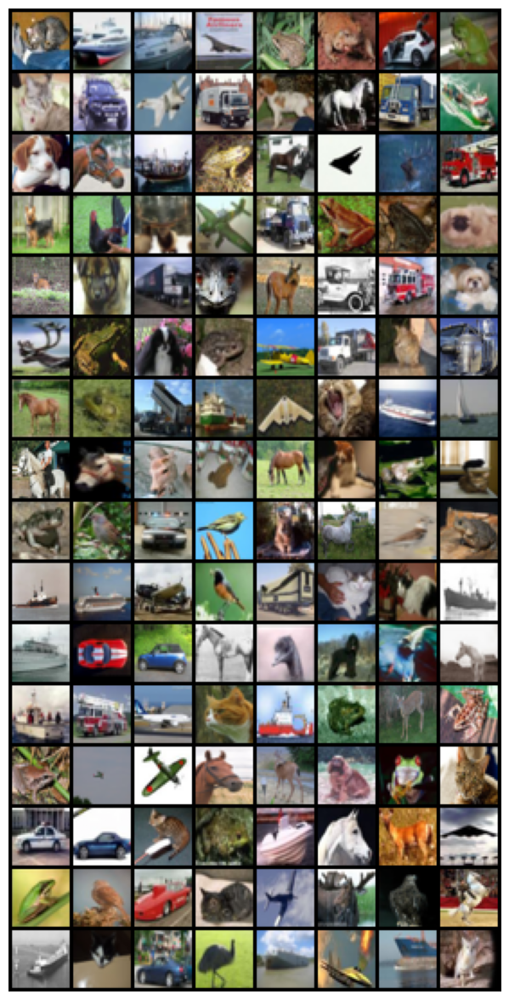

In [6]:
samples, _ = next(iter(loader_test))

samples = samples.cpu()
samples = make_grid(denorm(samples), nrow=8, padding=2, normalize=False,
                        value_range=None, scale_each=False, pad_value=0)
plt.figure(figsize = (15,15))
plt.axis('off')
show(samples)

#### Model Definition
Define hyperparameters and the model

### Architecture 1: Basic DCGAN with Learnable Scale

In [7]:
# *CODE FOR PART 2.1 IN THIS CELL*

# Choose the number of epochs, the learning rate
# and the size of the Generator's input noise vetor.

num_epochs = 1000
learning_rate = 0.0002
latent_vector_size = 100

# Other hyperparams


In [23]:
# *CODE FOR PART 2.1 IN THIS CELL*


class Generator(nn.Module):
    def __init__(self, latent_dim=latent_vector_size, img_channels=3):
        super(Generator, self).__init__()
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        self.gen = nn.Sequential(
            # Input: Z (latent vector)
            nn.ConvTranspose2d(latent_dim, 512, 4, 1, 0, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(True),
            # State size: (512) x 4 x 4
            nn.ConvTranspose2d(512, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            # State size: (256) x 8 x 8
            nn.ConvTranspose2d(256, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            # State size: (128) x 16 x 16
            nn.ConvTranspose2d(128, img_channels, 4, 2, 1, bias=False),
            nn.Tanh()
            # Output: (img_channels) x 32 x 32
        )
        self.scale = nn.Parameter(torch.tensor(1.0))  # Initialize scale parameter
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 

    # You can modify the arguments of this function if needed
    def forward(self, z):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        x = self.gen(z)
        return x * self.scale  # Apply scaling at the output
        #######################################################################
        #                       ** END OF YOUR CODE **
        #######################################################################
        # return out


class Discriminator(nn.Module):
    def __init__(self, img_channels=3):
        super(Discriminator, self).__init__()
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        self.disc = nn.Sequential(
            # Input: (img_channels) x 32 x 32
            nn.Conv2d(img_channels, 128, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # State size: (128) x 16 x 16
            nn.Conv2d(128, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            # State size: (256) x 8 x 8
            nn.Conv2d(256, 512, 4, 2, 1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            # State size: (512) x 4 x 4
            nn.Conv2d(512, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
            # Output: 1
        )
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
        
    # You can modify the arguments of this function if needed
    def forward(self, x):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        return self.disc(x).view(-1, 1).squeeze(1)
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
        
        # return out


<h2> Initialize Model and print number of parameters </h2>

We can use method `weights_init` to initialize the weights of the Generator and Discriminator networks. Otherwise, implement your own initialization, or do not use at all.

In [8]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

In [71]:
use_weights_init = True

model_G = Generator().to(device)
if use_weights_init:
    model_G.apply(weights_init)
params_G = sum(p.numel() for p in model_G.parameters() if p.requires_grad)
print("Total number of parameters in Generator is: {}".format(params_G))
print(model_G)
print('\n')

model_D = Discriminator().to(device)
if use_weights_init:
    model_D.apply(weights_init)
params_D = sum(p.numel() for p in model_D.parameters() if p.requires_grad)
print("Total number of parameters in Discriminator is: {}".format(params_D))
print(model_D)
print('\n')

print("Total number of parameters is: {}".format(params_G + params_D))

Total number of parameters in Generator is: 3448577
Generator(
  (gen): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): Tanh()
  )
)


Total number of parameters in Discriminator is: 2637312
Discriminator(
  (disc): Sequential(
    (0): Conv2d(3, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1,

### Part 2.1b: Training the Model

#### Defining a Loss

In [9]:
# You can modify the arguments of this function if needed
def loss_function(out, label):
    criterion = nn.BCELoss()  # Instantiate the BCELoss class
    loss = criterion(out, label)  # Use it to compute the loss
    return loss

<h3>Choose and initialize optimizers</h3>

In [73]:
    # setup optimizer
    # You are free to add a scheduler or change the optimizer if you want. We chose one for you for simplicity.
    beta1 = 0.5
    optimizerD = torch.optim.Adam(model_D.parameters(), lr=learning_rate, betas=(beta1, 0.999))
    optimizerG = torch.optim.Adam(model_G.parameters(), lr=learning_rate, betas=(beta1, 0.999))


<h3> Define fixed input vectors to monitor training and mode collapse. </h3>

In [74]:
fixed_noise = torch.randn(64, latent_vector_size, 1, 1, device=device)
# Additional input variables should be defined here
# Real and fake labels
real_label = 1
fake_label = 0

#### Training Loop
We've defined some variables to keep track of things during training:
* errD: Loss of Discriminator after being trained on real and fake instances
* errG: Loss of Generator
* D_x: Output of Discriminator for real images
* D_G_z1: Output of Discriminator for fake images (When Generator is not being trained)
* D_G_z2: Output of Discriminator for fake images (When Generator is being trained)

In [25]:
train_losses_G = []
train_losses_D = []

# <- You may wish to add logging info here
for epoch in range(num_epochs):
    # <- You may wish to add logging info here
    train_loss_D = 0
    train_loss_G = 0
    with tqdm.tqdm(loader_train, unit="batch") as tepoch: 
        for i, data in enumerate(tepoch):
            
            
            #######################################################################
            #                       ** START OF YOUR CODE **
            #######################################################################
            # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))

            # train with real
            model_D.zero_grad()
            # Format batch
            real_cpu = data[0].to(device)
            b_size = real_cpu.size(0)
            label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
            
            # Forward pass real batch through D
            output = model_D(real_cpu).view(-1)
            # Calculate loss on all-real batch
            errD_real = loss_function(output, label)
            # Calculate gradients for D in backward pass
            errD_real.backward()
            D_x = output.mean().item()


            ## Train with all-fake batch
            # Generate batch of latent vectors
            noise = torch.randn(b_size, latent_vector_size, 1, 1, device=device)
            # Generate fake image batch with G
            fake = model_G(noise)
            label.fill_(fake_label)
            # Classify all fake batch with D
            output = model_D(fake.detach()).view(-1)
            # Calculate D's loss on the all-fake batch
            errD_fake = loss_function(output, label)
            # Calculate the gradients for this batch
            errD_fake.backward()
            D_G_z1 = output.mean().item()
            # Add the gradients from the all-real and all-fake batches
            errD = errD_real + errD_fake
            # Update D
            optimizerD.step()
    
            # (2) Update G network: maximize log(D(G(z)))
            model_G.zero_grad()
            label.fill_(real_label)  # fake labels are real for generator cost
            # Since we just updated D, perform another forward pass of all-fake batch through D
            output = model_D(fake).view(-1)
            # Calculate G's loss based on this output
            errG = loss_function(output, label)
            # Calculate gradients for G
            errG.backward()
            D_G_z2 = output.mean().item()
            # Update G
            optimizerG.step()
            ####################################################################### 
            #                       ** END OF YOUR CODE **
            ####################################################################### 
            # Logging 
            if i % 50 == 0:
                tepoch.set_description(f"Epoch {epoch}")
                tepoch.set_postfix(D_G_z=f"{D_G_z1:.3f}/{D_G_z2:.3f}", D_x=D_x,
                                  Loss_D=errD.item(), Loss_G=errG.item())
            # Save Losses for plotting later
            train_loss_D += errD.item()
            train_loss_G += errG.item()

    if epoch == 0:
        save_image(denorm(real_cpu.cpu()).float(), content_path/'GAN/real_samples.png')
    with torch.no_grad():
        fake = model_G(fixed_noise)
        save_image(denorm(fake.cpu()).float(), str(content_path/'GAN/fake_samples_epoch_%03d.png') % epoch)
    train_losses_D.append(train_loss_D / len(loader_train))
    train_losses_G.append(train_loss_G / len(loader_train))
    
# save  models 
# if your discriminator/generator are conditional you'll want to change the inputs here
torch.jit.save(torch.jit.trace(model_G, (fixed_noise)), content_path/'GAN/GAN_G_model.pth')
torch.jit.save(torch.jit.trace(model_D, (fake)), content_path/'GAN/GAN_D_model.pth')

Epoch 999: 100%|█████████████████████████████████████████████████████████| 391/391 [00:10<00:00, 37.00batch/s, D_G_z=0.005/0.003, D_x=0.979, Loss_D=0.037, Loss_G=10.9]


### Architecture 2: Modified Normalization and Learning Rates

In [105]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torch.utils.data import sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
from torch.optim.lr_scheduler import StepLR, MultiStepLR
import torch.nn.functional as F
import matplotlib.pyplot as plt

mean_v2 = torch.Tensor([0.5,0.5,0.5])
std_v2 = torch.Tensor([0.5,0.5,0.5])
unnormalize_v2 = transforms.Normalize((-mean_v2 / std_v2).tolist(), (1.0 / std_v2).tolist())

def denorm_v2(x, channels=None, w=None ,h=None, resize = False):
    
    x = unnormalize_v2(x)
    if resize:
        if channels is None or w is None or h is None:
            print('Number of channels, width and height must be provided for resize.')
        x = x.view(x.size(0), channels, w, h)
    return x


def show(img):
    npimg = img.cpu().numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)))

if not os.path.exists(content_path/'GAN'):
    os.makedirs(content_path/'GAN')

GPU = True # Choose whether to use GPU
if GPU:
    device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")
else:
    device = torch.device("cpu")
print(f'Using {device}')


if torch.cuda.is_available():
    torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

batch_size_v2 =  128

transform = transforms.Compose([
     transforms.ToTensor(),
     transforms.Normalize(mean=mean_v2, std=std_v2),                        
])
# note - data_path was initialized at the top of the notebook
cifar10_train = datasets.CIFAR10(data_path, train=True, download=True, transform=transform)
cifar10_test = datasets.CIFAR10(data_path, train=False, download=True, transform=transform)
loader_train = DataLoader(cifar10_train, batch_size=batch_size_v2)
loader_test = DataLoader(cifar10_test, batch_size=batch_size_v2)

num_epochs_v2 = 200
learning_rate_D = 0.0002
learning_rate_G = 0.0004
latent_vector_size_v2 = 256



Using cuda
Files already downloaded and verified
Files already downloaded and verified


In [106]:
# *CODE FOR PART 2.1 IN THIS CELL*


class GeneratorV2(nn.Module):
    def __init__(self, latent_dim=latent_vector_size_v2, img_channels=3):
        super(GeneratorV2, self).__init__()
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        self.gen = nn.Sequential(
            # Input: Z (latent vector)
            nn.ConvTranspose2d(latent_dim, 512, 4, 1, 0, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(True),
            # State size: (512) x 4 x 4
            nn.ConvTranspose2d(512, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            # State size: (256) x 8 x 8
            nn.ConvTranspose2d(256, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            # State size: (128) x 16 x 16
            nn.ConvTranspose2d(128, img_channels, 4, 2, 1, bias=False),
            nn.Tanh()
            # Output: (img_channels) x 32 x 32
        )
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 

    # You can modify the arguments of this function if needed
    def forward(self, z):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        return self.gen(z)
        #######################################################################
        #                       ** END OF YOUR CODE **
        #######################################################################
        # return out


class DiscriminatorV2(nn.Module):
    def __init__(self, img_channels=3):
        super(DiscriminatorV2, self).__init__()
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        self.disc = nn.Sequential(
            # Input: (img_channels) x 32 x 32
            nn.Conv2d(img_channels, 128, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # State size: (128) x 16 x 16
            nn.Conv2d(128, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            # State size: (256) x 8 x 8
            nn.Conv2d(256, 512, 4, 2, 1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            # State size: (512) x 4 x 4
            nn.Conv2d(512, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
            # Output: 1
        )
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
        
    # You can modify the arguments of this function if needed
    def forward(self, x):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        return self.disc(x).view(-1, 1).squeeze(1)
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
    


In [107]:
use_weights_init = True

model_G_v2 = GeneratorV2().to(device)
if use_weights_init:
    model_G_v2.apply(weights_init)
params_G_v2 = sum(p.numel() for p in model_G_v2.parameters() if p.requires_grad)
print("Total number of parameters in GeneratorV2 is: {}".format(params_G_v2))
print(model_G_v2)
print('\n')

model_D_v2 = DiscriminatorV2().to(device)
if use_weights_init:
    model_D_v2.apply(weights_init)
params_D_v2 = sum(p.numel() for p in model_D_v2.parameters() if p.requires_grad)
print("Total number of parameters in DiscriminatorV2 is: {}".format(params_D_v2))
print(model_D_v2)
print('\n')

print("Total number of parameters is: {}".format(params_G_v2 + params_D_v2))

beta1 = 0.5
optimizerD_v2 = torch.optim.Adam(model_D_v2.parameters(), lr=learning_rate_D, betas=(beta1, 0.999))
optimizerG_v2 = torch.optim.Adam(model_G_v2.parameters(), lr=learning_rate_G, betas=(beta1, 0.999))

fixed_noise_v2 = torch.randn(64, latent_vector_size_v2, 1, 1, device=device)
# Real and fake labels
real_label = 1
fake_label = 0

Total number of parameters in GeneratorV2 is: 4726528
GeneratorV2(
  (gen): Sequential(
    (0): ConvTranspose2d(256, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): Tanh()
  )
)


Total number of parameters in DiscriminatorV2 is: 2637312
DiscriminatorV2(
  (disc): Sequential(
    (0): Conv2d(3, 128, kernel_size=(4, 4), stride=(2, 2), pad

In [108]:
train_losses_G_v2 = []
train_losses_D_v2 = []

# <- You may wish to add logging info here
for epoch in range(num_epochs_v2):
    # <- You may wish to add logging info here
    train_loss_D = 0
    train_loss_G = 0
    with tqdm.tqdm(loader_train, unit="batch") as tepoch: 
        for i, data in enumerate(tepoch):
            
            
            #######################################################################
            #                       ** START OF YOUR CODE **
            #######################################################################
            # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))

            # train with real
            model_D_v2.zero_grad()
            # Format batch
            real_cpu = data[0].to(device)
            b_size = real_cpu.size(0)
            label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
            
            # Forward pass real batch through D
            output = model_D_v2(real_cpu).view(-1)
            # Calculate loss on all-real batch
            errD_real = loss_function(output, label)
            # Calculate gradients for D in backward pass
            errD_real.backward()
            D_x = output.mean().item()


            ## Train with all-fake batch
            # Generate batch of latent vectors
            noise = torch.randn(b_size, latent_vector_size_v2, 1, 1, device=device)
            # Generate fake image batch with G
            fake = model_G_v2(noise)
            label.fill_(fake_label)
            # Classify all fake batch with D
            output = model_D_v2(fake.detach()).view(-1)
            # Calculate D's loss on the all-fake batch
            errD_fake = loss_function(output, label)
            # Calculate the gradients for this batch
            errD_fake.backward()
            D_G_z1 = output.mean().item()
            # Add the gradients from the all-real and all-fake batches
            errD = errD_real + errD_fake
            # Update D
            optimizerD_v2.step()
    
            # (2) Update G network: maximize log(D(G(z)))
            model_G_v2.zero_grad()
            label.fill_(real_label)  # fake labels are real for generator cost
            # Since we just updated D, perform another forward pass of all-fake batch through D
            output = model_D_v2(fake).view(-1)
            # Calculate G's loss based on this output
            errG = loss_function(output, label)
            # Calculate gradients for G
            errG.backward()
            D_G_z2 = output.mean().item()
            # Update G
            optimizerG_v2.step()
            ####################################################################### 
            #                       ** END OF YOUR CODE **
            ####################################################################### 
            # Logging 
            if i % 50 == 0:
                tepoch.set_description(f"Epoch {epoch}")
                tepoch.set_postfix(D_G_z=f"{D_G_z1:.3f}/{D_G_z2:.3f}", D_x=D_x,
                                  Loss_D=errD.item(), Loss_G=errG.item())
            # Save Losses for plotting later
            train_loss_D += errD.item()
            train_loss_G += errG.item()

    if epoch == 0:
        save_image(denorm_v2(real_cpu.cpu()).float(), content_path/'GAN/real_samples_v2.png')
    with torch.no_grad():
        fake = model_G_v2(fixed_noise_v2)
        save_image(denorm_v2(fake.cpu()).float(), str(content_path/'GAN/fake_samples_epoch_%03d_v2.png') % epoch)
    train_losses_D_v2.append(train_loss_D / len(loader_train))
    train_losses_G_v2.append(train_loss_G / len(loader_train))
    
# save  models 
# if your discriminator/generator are conditional you'll want to change the inputs here
torch.jit.save(torch.jit.trace(model_G_v2, (fixed_noise_v2)), content_path/'GAN/GAN_G_model_v2.pth')
torch.jit.save(torch.jit.trace(model_D_v2, (fake)), content_path/'GAN/GAN_D_model_v2.pth')

Epoch 0: 100%|█| 391/391 [00:14<00:00, 27.31batch/s, D_G_z=0.252/0.114, D_x=0.638, Loss_D=0.8
Epoch 1: 100%|█| 391/391 [00:14<00:00, 27.31batch/s, D_G_z=0.193/0.083, D_x=0.725, Loss_D=0.6
Epoch 2: 100%|█| 391/391 [00:13<00:00, 28.13batch/s, D_G_z=0.322/0.065, D_x=0.811, Loss_D=0.7
Epoch 3: 100%|█| 391/391 [00:14<00:00, 27.22batch/s, D_G_z=0.185/0.067, D_x=0.763, Loss_D=0.5
Epoch 4: 100%|█| 391/391 [00:14<00:00, 27.28batch/s, D_G_z=0.234/0.088, D_x=0.863, Loss_D=0.4
Epoch 5: 100%|█| 391/391 [00:13<00:00, 28.25batch/s, D_G_z=0.398/0.072, D_x=0.843, Loss_D=0.7
Epoch 6: 100%|█| 391/391 [00:14<00:00, 27.26batch/s, D_G_z=0.477/0.089, D_x=0.815, Loss_D=0.9
Epoch 7: 100%|█| 391/391 [00:14<00:00, 27.20batch/s, D_G_z=0.544/0.062, D_x=0.808, Loss_D=1.1
Epoch 8: 100%|█| 391/391 [00:14<00:00, 27.16batch/s, D_G_z=0.556/0.050, D_x=0.856, Loss_D=1.1
Epoch 9: 100%|█| 391/391 [00:14<00:00, 27.44batch/s, D_G_z=0.357/0.110, D_x=0.789, Loss_D=0.7
Epoch 10: 100%|█| 391/391 [00:14<00:00, 27.25batch/s, D_G_z=

### Architecture 3 [BEST]: Label Smoothing and Dropout Integration

In [4]:
mean_v3 = torch.Tensor([0.5,0.5,0.5])
std_v3 = torch.Tensor([0.5,0.5,0.5])
unnormalize_v3 = transforms.Normalize((-mean_v3 / std_v3).tolist(), (1.0 / std_v3).tolist())

def denorm_v3(x, channels=None, w=None ,h=None, resize = False):
    
    x = unnormalize_v3(x)
    if resize:
        if channels is None or w is None or h is None:
            print('Number of channels, width and height must be provided for resize.')
        x = x.view(x.size(0), channels, w, h)
    return x
    
def show(img):
    npimg = img.cpu().numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)))

if not os.path.exists(content_path/'GAN'):
    os.makedirs(content_path/'GAN')

GPU = True # Choose whether to use GPU
if GPU:
    device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")
else:
    device = torch.device("cpu")
print(f'Using {device}')

if torch.cuda.is_available():
    torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

batch_size_v3 =  128 

transform = transforms.Compose([
     transforms.ToTensor(),
     transforms.Normalize(mean=mean_v3, std=std_v3),                        
])
# note - data_path was initialized at the top of the notebook
cifar10_train = datasets.CIFAR10(data_path, train=True, download=True, transform=transform)
cifar10_test = datasets.CIFAR10(data_path, train=False, download=True, transform=transform)
loader_train = DataLoader(cifar10_train, batch_size=batch_size_v3)
loader_test = DataLoader(cifar10_test, batch_size=batch_size_v3)

num_epochs_v3 = 200
learning_rate_D = 0.0002
learning_rate_G = 0.0004
latent_vector_size_v3 = 256

Using cuda
Files already downloaded and verified
Files already downloaded and verified


In [9]:
class GeneratorV3(nn.Module):
    def __init__(self, latent_dim=latent_vector_size_v3, img_channels=3):
        super(GeneratorV3, self).__init__()
        self.gen = nn.Sequential(
            nn.ConvTranspose2d(latent_dim, 512, 4, 1, 0, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(True),
            nn.ConvTranspose2d(512, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            nn.ConvTranspose2d(256, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            nn.ConvTranspose2d(128, img_channels, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, z):
        return self.gen(z)


class DiscriminatorV3(nn.Module):
    def __init__(self, img_channels=3):
        super(DiscriminatorV3, self).__init__()
        self.disc = nn.Sequential(
            nn.Conv2d(img_channels, 128, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.2),  # Dropout layer
            nn.Conv2d(128, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.2),  # Dropout layer
            nn.Conv2d(256, 512, 4, 2, 1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.2),  # Dropout layer
            nn.Conv2d(512, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.disc(x).view(-1, 1).squeeze(1)


In [10]:
use_weights_init = True

model_G_v3 = GeneratorV3().to(device)
if use_weights_init:
    model_G_v3.apply(weights_init)
params_G_v3 = sum(p.numel() for p in model_G_v3.parameters() if p.requires_grad)
print("Total number of parameters in GeneratorV3 is: {}".format(params_G_v3))
print(model_G_v3)
print('\n')

model_D_v3 = DiscriminatorV3().to(device)
if use_weights_init:
    model_D_v3.apply(weights_init)
params_D_v3 = sum(p.numel() for p in model_D_v3.parameters() if p.requires_grad)
print("Total number of parameters in DiscriminatorV3 is: {}".format(params_D_v3))
print(model_D_v3)
print('\n')

print("Total number of parameters is: {}".format(params_G_v3 + params_D_v3))

beta1 = 0.5
optimizerD_v3 = torch.optim.Adam(model_D_v3.parameters(), lr=learning_rate_D, betas=(beta1, 0.999))
optimizerG_v3 = torch.optim.Adam(model_G_v3.parameters(), lr=learning_rate_G, betas=(beta1, 0.999))

fixed_noise_v3 = torch.randn(64, latent_vector_size_v3, 1, 1, device=device)
# Real and fake labels
real_label = 1
fake_label = 0

Total number of parameters in GeneratorV3 is: 4726528
GeneratorV3(
  (gen): Sequential(
    (0): ConvTranspose2d(256, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): Tanh()
  )
)


Total number of parameters in DiscriminatorV3 is: 2637312
DiscriminatorV3(
  (disc): Sequential(
    (0): Conv2d(3, 128, kernel_size=(4, 4), stride=(2, 2), pad

In [11]:
train_losses_G_v3 = []
train_losses_D_v3 = []

real_label_variability = 0.1  # Variability range for real labels
fake_label_variability = 0.1  # Variability range for fake labels

# <- You may wish to add logging info here
for epoch in range(num_epochs_v3):
    # <- You may wish to add logging info here
    train_loss_D = 0
    train_loss_G = 0
    with tqdm.tqdm(loader_train, unit="batch") as tepoch: 
        for i, data in enumerate(tepoch):
            
            
            #######################################################################
            #                       ** START OF YOUR CODE **
            #######################################################################
            # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))

            # train with real
            model_D_v3.zero_grad()
            # Format batch
            real_cpu = data[0].to(device)
            b_size = real_cpu.size(0)
            
            # Apply random label smoothing for real labels
            smooth_real_labels = (1.0 - real_label_variability) + \
                torch.rand(b_size, device=device) * real_label_variability
            
            # Forward pass real batch through D
            output = model_D_v3(real_cpu).view(-1)
            # Calculate loss on all-real batch
            errD_real = loss_function(output, smooth_real_labels)
            # Calculate gradients for D in backward pass
            errD_real.backward()
            D_x = output.mean().item()


            ## Train with all-fake batch
            # Generate batch of latent vectors
            noise = torch.randn(b_size, latent_vector_size_v3, 1, 1, device=device)
            # Generate fake image batch with G
            fake = model_G_v3(noise)

            # Apply random label smoothing for fake labels
            smooth_fake_labels = torch.rand(b_size, device=device) * fake_label_variability

            # Classify all fake batch with D
            output = model_D_v3(fake.detach()).view(-1)
            # Calculate D's loss on the all-fake batch
            errD_fake = loss_function(output, smooth_fake_labels)
            # Calculate the gradients for this batch
            errD_fake.backward()
            D_G_z1 = output.mean().item()
            # Add the gradients from the all-real and all-fake batches
            errD = errD_real + errD_fake
            # Update D
            optimizerD_v3.step()
    
            # (2) Update G network: maximize log(D(G(z)))
            model_G_v3.zero_grad()
            
            # Since we just updated D, perform another forward pass of all-fake batch through D
            output = model_D_v3(fake).view(-1)
            # Calculate G's loss based on this output
            errG = loss_function(output, smooth_real_labels)
            # Calculate gradients for G
            errG.backward()
            D_G_z2 = output.mean().item()
            # Update G
            optimizerG_v3.step()
            ####################################################################### 
            #                       ** END OF YOUR CODE **
            ####################################################################### 
            # Logging 
            if i % 50 == 0:
                tepoch.set_description(f"Epoch {epoch}")
                tepoch.set_postfix(D_G_z=f"{D_G_z1:.3f}/{D_G_z2:.3f}", D_x=D_x,
                                  Loss_D=errD.item(), Loss_G=errG.item())
            # Save Losses for plotting later
            train_loss_D += errD.item()
            train_loss_G += errG.item()

    if epoch == 0:
        save_image(denorm_v3(real_cpu.cpu()).float(), content_path/'GAN/real_samples_v3.png')
    with torch.no_grad():
        fake = model_G_v3(fixed_noise_v3)
        save_image(denorm_v3(fake.cpu()).float(), str(content_path/'GAN/fake_samples_epoch_%03d_v3.png') % epoch)
    train_losses_D_v3.append(train_loss_D / len(loader_train))
    train_losses_G_v3.append(train_loss_G / len(loader_train))
    
# save  models 
# if your discriminator/generator are conditional you'll want to change the inputs here
torch.jit.save(torch.jit.trace(model_G_v3, (fixed_noise_v3)), content_path/'GAN/GAN_G_model_v3.pth')
torch.jit.save(torch.jit.trace(model_D_v3, (fake)), content_path/'GAN/GAN_D_model_v3.pth')

Epoch 0: 100%|█| 391/391 [00:17<00:00, 22.16batch/s, D_G_z=0.354/0.098, D_x=0.611, Loss_D=1.2
Epoch 1: 100%|█| 391/391 [00:15<00:00, 24.46batch/s, D_G_z=0.334/0.125, D_x=0.743, Loss_D=0.9
Epoch 2: 100%|█| 391/391 [00:16<00:00, 23.56batch/s, D_G_z=0.267/0.141, D_x=0.758, Loss_D=0.8
Epoch 3: 100%|█| 391/391 [00:15<00:00, 25.78batch/s, D_G_z=0.477/0.047, D_x=0.833, Loss_D=1.0
Epoch 4: 100%|█| 391/391 [00:16<00:00, 23.65batch/s, D_G_z=0.346/0.111, D_x=0.837, Loss_D=0.8
Epoch 5: 100%|█| 391/391 [00:16<00:00, 24.14batch/s, D_G_z=0.328/0.184, D_x=0.699, Loss_D=0.9
Epoch 6: 100%|█| 391/391 [00:16<00:00, 23.62batch/s, D_G_z=0.520/0.169, D_x=0.681, Loss_D=1.3
Epoch 7: 100%|█| 391/391 [00:15<00:00, 24.57batch/s, D_G_z=0.371/0.241, D_x=0.662, Loss_D=1.0
Epoch 8: 100%|█| 391/391 [00:16<00:00, 24.13batch/s, D_G_z=0.680/0.162, D_x=0.81, Loss_D=1.59
Epoch 9: 100%|█| 391/391 [00:15<00:00, 25.09batch/s, D_G_z=0.564/0.106, D_x=0.787, Loss_D=1.2
Epoch 10: 100%|█| 391/391 [00:16<00:00, 24.36batch/s, D_G_z=

### Architecture 4: Addition of Minibatch Discrimination and Spectral Normalization

In [106]:
mean_v4 = torch.Tensor([0.5,0.5,0.5])
std_v4 = torch.Tensor([0.5,0.5,0.5])
unnormalize_v4 = transforms.Normalize((-mean_v4 / std_v4).tolist(), (1.0 / std_v4).tolist())

def denorm_v4(x, channels=None, w=None ,h=None, resize = False):
    
    x = unnormalize_v4(x)
    if resize:
        if channels is None or w is None or h is None:
            print('Number of channels, width and height must be provided for resize.')
        x = x.view(x.size(0), channels, w, h)
    return x
    
def show(img):
    npimg = img.cpu().numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)))

if not os.path.exists(content_path/'GAN'):
    os.makedirs(content_path/'GAN')

GPU = True # Choose whether to use GPU
if GPU:
    device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")
else:
    device = torch.device("cpu")
print(f'Using {device}')


if torch.cuda.is_available():
    torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

batch_size_v4 =  128 

transform = transforms.Compose([
     transforms.ToTensor(),
     transforms.Normalize(mean=mean_v4, std=std_v4),                        
])
# note - data_path was initialized at the top of the notebook
cifar10_train = datasets.CIFAR10(data_path, train=True, download=True, transform=transform)
cifar10_test = datasets.CIFAR10(data_path, train=False, download=True, transform=transform)
loader_train = DataLoader(cifar10_train, batch_size=batch_size_v4)
loader_test = DataLoader(cifar10_test, batch_size=batch_size_v4)

num_epochs_v4 = 200
learning_rate_D = 0.0002
learning_rate_G = 0.0004
latent_vector_size_v4 = 256

Using cuda
Files already downloaded and verified
Files already downloaded and verified


In [107]:
# layernorm did not work
from torch.nn.utils.spectral_norm import spectral_norm
class GeneratorV4(nn.Module):
    def __init__(self, latent_dim=latent_vector_size_v4, img_channels=3):
        super(GeneratorV4, self).__init__()
        self.gen = nn.Sequential(
            nn.ConvTranspose2d(latent_dim, 512, 4, 1, 0, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(True),
            nn.ConvTranspose2d(512, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            nn.ConvTranspose2d(256, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            nn.ConvTranspose2d(128, img_channels, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, z):
        return self.gen(z)


class MinibatchDiscrimination(nn.Module):
    def __init__(self, in_features, out_features, kernel_dims, mean=False):
        super(MinibatchDiscrimination, self).__init__()
        self.in_features = in_features
        self.out_features = out_features
        self.kernel_dims = kernel_dims
        self.mean = mean
        self.T = nn.Parameter(torch.randn(in_features, out_features, kernel_dims))
    
    def forward(self, x):
        # Apply minibatch discrimination
        matrices = x.mm(self.T.view(self.in_features, -1))
        matrices = matrices.view(-1, self.out_features, self.kernel_dims)
        
        M = matrices.unsqueeze(0)  # Broadcast along 0
        M_T = M.permute(1, 0, 2, 3)  # Transpose the batch and feature dims
        norm = torch.abs(M - M_T).sum(3)  # Calculate L1 norm
        expnorm = torch.exp(-norm)
        o_b = expnorm.sum(0)  # Sum over the batch
        
        if self.mean:
            o_b /= x.size(0)
        
        x = torch.cat([x, o_b], 1)  # Concatenate along the feature dimension
        return x

class DiscriminatorV4(nn.Module):
    def __init__(self, img_channels=3):
        super(DiscriminatorV4, self).__init__()
        self.disc = nn.Sequential(
            spectral_norm(nn.Conv2d(img_channels, 128, 4, 2, 1, bias=False)),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.2),
            spectral_norm(nn.Conv2d(128, 256, 4, 2, 1, bias=False)),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.2),
            spectral_norm(nn.Conv2d(256, 512, 4, 2, 1, bias=False)),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.2),
            nn.Flatten(),
            MinibatchDiscrimination(in_features=512*4*4, out_features=128, kernel_dims=5),
            spectral_norm(nn.Linear(512*4*4 + 128, 1)),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.disc(x).view(-1, 1).squeeze(1)




In [108]:
use_weights_init = True

model_G_v4 = GeneratorV4().to(device)
if use_weights_init:
    model_G_v4.apply(weights_init)
params_G_v4 = sum(p.numel() for p in model_G_v4.parameters() if p.requires_grad)
print("Total number of parameters in GeneratorV4 is: {}".format(params_G_v4))
print(model_G_v4)
print('\n')

model_D_v4 = DiscriminatorV4().to(device)
if use_weights_init:
    model_D_v4.apply(weights_init)
params_D_v4 = sum(p.numel() for p in model_D_v4.parameters() if p.requires_grad)
print("Total number of parameters in DiscriminatorV4 is: {}".format(params_D_v4))
print(model_D_v4)
print('\n')

print("Total number of parameters is: {}".format(params_G_v4 + params_D_v4))

beta1 = 0.5
optimizerD_v4 = torch.optim.AdamW(model_D_v4.parameters(), lr=learning_rate_D, betas=(beta1, 0.999))
optimizerG_v4 = torch.optim.AdamW(model_G_v4.parameters(), lr=learning_rate_G, betas=(beta1, 0.999))

fixed_noise_v4 = torch.randn(64, latent_vector_size_v4, 1, 1, device=device)
# Real and fake labels
real_label = 1
fake_label = 0

Total number of parameters in GeneratorV4 is: 4726528
GeneratorV4(
  (gen): Sequential(
    (0): ConvTranspose2d(256, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): Tanh()
  )
)


Total number of parameters in DiscriminatorV4 is: 7880321
DiscriminatorV4(
  (disc): Sequential(
    (0): Conv2d(3, 128, kernel_size=(4, 4), stride=(2, 2), pad

In [109]:
train_losses_G_v4 = []
train_losses_D_v4 = []

real_label_variability = 0.1  # Variability range for real labels
fake_label_variability = 0.1  # Variability range for fake labels

# <- You may wish to add logging info here
for epoch in range(num_epochs_v4):
    # <- You may wish to add logging info here
    train_loss_D = 0
    train_loss_G = 0
    with tqdm.tqdm(loader_train, unit="batch") as tepoch: 
        for i, data in enumerate(tepoch):
            
            
            #######################################################################
            #                       ** START OF YOUR CODE **
            #######################################################################
            # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))

            # train with real
            model_D_v4.zero_grad()
            # Format batch
            real_cpu = data[0].to(device)
            b_size = real_cpu.size(0)
            
            # Apply random label smoothing for real labels
            smooth_real_labels = (1.0 - real_label_variability) + \
                torch.rand(b_size, device=device) * real_label_variability
            
            # Forward pass real batch through D
            output = model_D_v4(real_cpu).view(-1)
            # Calculate loss on all-real batch
            errD_real = loss_function(output, smooth_real_labels)
            # Calculate gradients for D in backward pass
            errD_real.backward()
            D_x = output.mean().item()


            ## Train with all-fake batch
            # Generate batch of latent vectors
            noise = torch.randn(b_size, latent_vector_size_v4, 1, 1, device=device)
            # Generate fake image batch with G
            fake = model_G_v4(noise)

            # Apply random label smoothing for fake labels
            smooth_fake_labels = torch.rand(b_size, device=device) * fake_label_variability

            # Classify all fake batch with D
            output = model_D_v4(fake.detach()).view(-1)
            # Calculate D's loss on the all-fake batch
            errD_fake = loss_function(output, smooth_fake_labels)
            # Calculate the gradients for this batch
            errD_fake.backward()
            D_G_z1 = output.mean().item()
            # Add the gradients from the all-real and all-fake batches
            errD = errD_real + errD_fake
            # Update D
            optimizerD_v4.step()
    
            # (2) Update G network: maximize log(D(G(z)))
            model_G_v4.zero_grad()
            
            # Since we just updated D, perform another forward pass of all-fake batch through D
            output = model_D_v4(fake).view(-1)
            # Calculate G's loss based on this output
            errG = loss_function(output, smooth_real_labels)
            # Calculate gradients for G
            errG.backward()
            D_G_z2 = output.mean().item()
            # Update G
            optimizerG_v4.step()
            ####################################################################### 
            #                       ** END OF YOUR CODE **
            ####################################################################### 
            # Logging 
            if i % 50 == 0:
                tepoch.set_description(f"Epoch {epoch}")
                tepoch.set_postfix(D_G_z=f"{D_G_z1:.3f}/{D_G_z2:.3f}", D_x=D_x,
                                  Loss_D=errD.item(), Loss_G=errG.item())
            # Save Losses for plotting later
            train_loss_D += errD.item()
            train_loss_G += errG.item()

    if epoch == 0:
        save_image(denorm_v4(real_cpu.cpu()).float(), content_path/'GAN/real_samples_v4.png')
    with torch.no_grad():
        fake = model_G_v4(fixed_noise_v4)
        save_image(denorm_v4(fake.cpu()).float(), str(content_path/'GAN/fake_samples_epoch_%03d_v4.png') % epoch)
    train_losses_D_v4.append(train_loss_D / len(loader_train))
    train_losses_G_v4.append(train_loss_G / len(loader_train))
    
# save  models 
# if your discriminator/generator are conditional you'll want to change the inputs here
torch.jit.save(torch.jit.trace(model_G_v4, (fixed_noise_v4)), content_path/'GAN/GAN_G_model_v4.pth')
torch.jit.save(torch.jit.trace(model_D_v4, (fake)), content_path/'GAN/GAN_D_model_v4.pth')

Epoch 0: 100%|█| 391/391 [00:17<00:00, 22.87batch/s, D_G_z=0.406/0.105, D_x=0.658, Loss_D=1.1
Epoch 1: 100%|█| 391/391 [00:17<00:00, 22.69batch/s, D_G_z=0.130/0.176, D_x=0.597, Loss_D=0.8
Epoch 2: 100%|█| 391/391 [00:17<00:00, 22.61batch/s, D_G_z=0.359/0.157, D_x=0.785, Loss_D=0.8
Epoch 3: 100%|█| 391/391 [00:17<00:00, 22.59batch/s, D_G_z=0.235/0.099, D_x=0.816, Loss_D=0.6
Epoch 4: 100%|█| 391/391 [00:17<00:00, 22.80batch/s, D_G_z=0.410/0.101, D_x=0.781, Loss_D=0.9
Epoch 5: 100%|█| 391/391 [00:17<00:00, 22.70batch/s, D_G_z=0.290/0.231, D_x=0.642, Loss_D=0.9
Epoch 6: 100%|█| 391/391 [00:17<00:00, 22.47batch/s, D_G_z=0.482/0.245, D_x=0.689, Loss_D=1.1
Epoch 7: 100%|█| 391/391 [00:17<00:00, 22.82batch/s, D_G_z=0.284/0.302, D_x=0.572, Loss_D=1.0
Epoch 8: 100%|█| 391/391 [00:17<00:00, 22.76batch/s, D_G_z=0.255/0.231, D_x=0.636, Loss_D=0.9
Epoch 9: 100%|█| 391/391 [00:16<00:00, 23.31batch/s, D_G_z=0.441/0.297, D_x=0.625, Loss_D=1.1
Epoch 10: 100%|█| 391/391 [00:16<00:00, 23.53batch/s, D_G_z=

## Part 2.1c: Results

### Generator samples 

### Architecture 1: Generator Sample

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


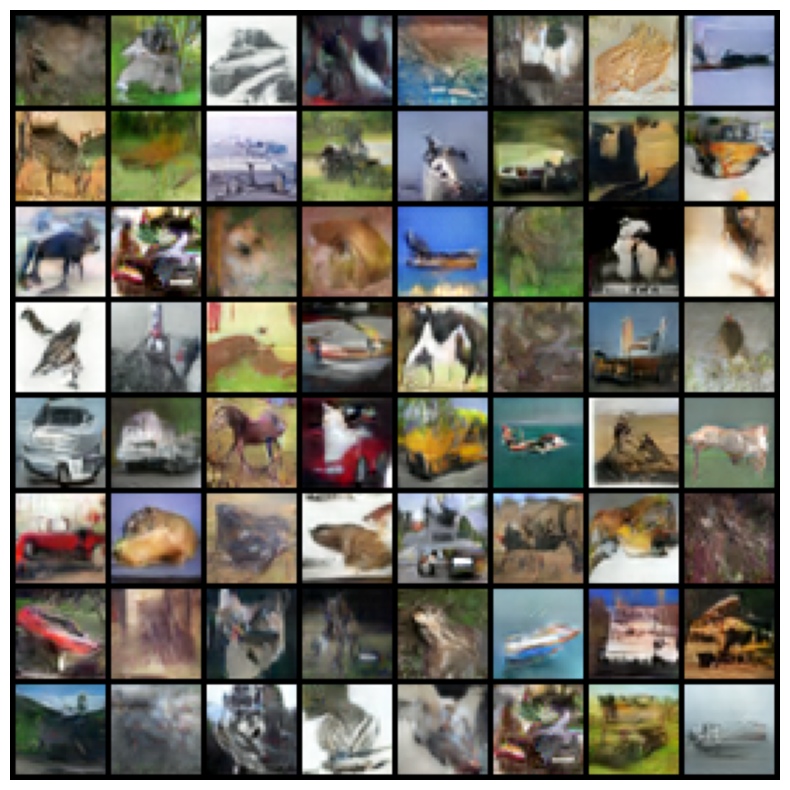

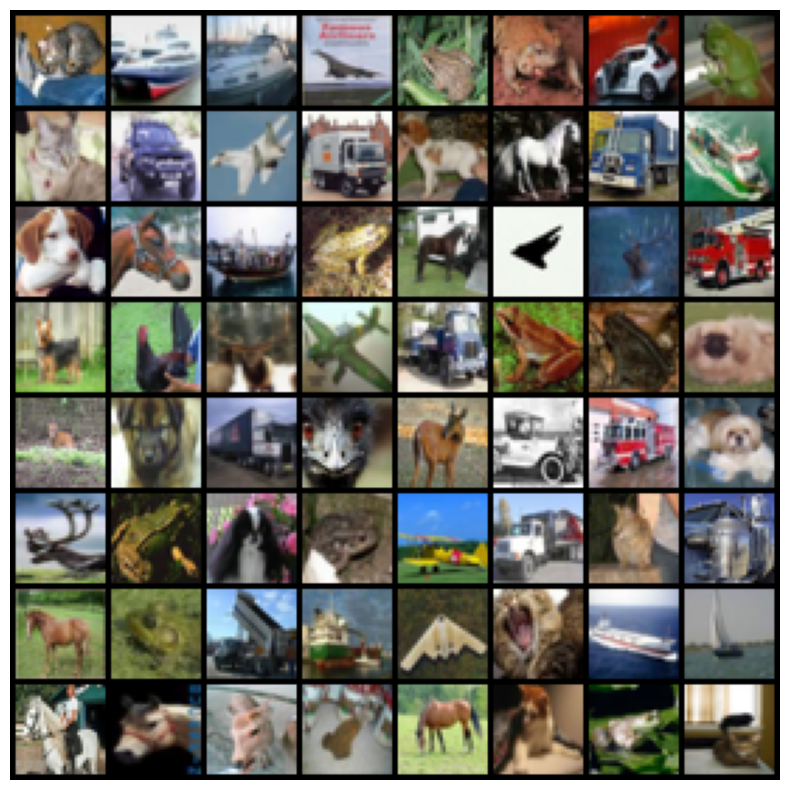

In [25]:
# For generating and visualizing 64 generated images
# Load the generator model
model_G = torch.jit.load(content_path/'GAN/GAN_G_model.pth') # the first version

input_noise = torch.randn(64, latent_vector_size, 1, 1, device=device)  # generate 64 images
with torch.no_grad():
    generated = model_G(input_noise).cpu()/5
    generated = make_grid(denorm(generated), nrow=8, padding=2, normalize=False,
                        value_range=None, scale_each=False, pad_value=0)  # nrow=8 for 64 images
    plt.figure(figsize=(10,10))
    plt.axis('off')  
    show(generated)

it = iter(loader_test)
sample_inputs, _ = next(it)  
fixed_input = sample_inputs[:64, :, :, :]  # Select first 64 images for a fair comparison
img = make_grid(denorm(fixed_input), nrow=8, padding=2, normalize=False,
                        value_range=None, scale_each=False, pad_value=0)  # nrow=8 for 64 images
plt.figure(figsize=(10,10))
plt.axis('off')  
show(img)



### Architecture 2: Generator Sample

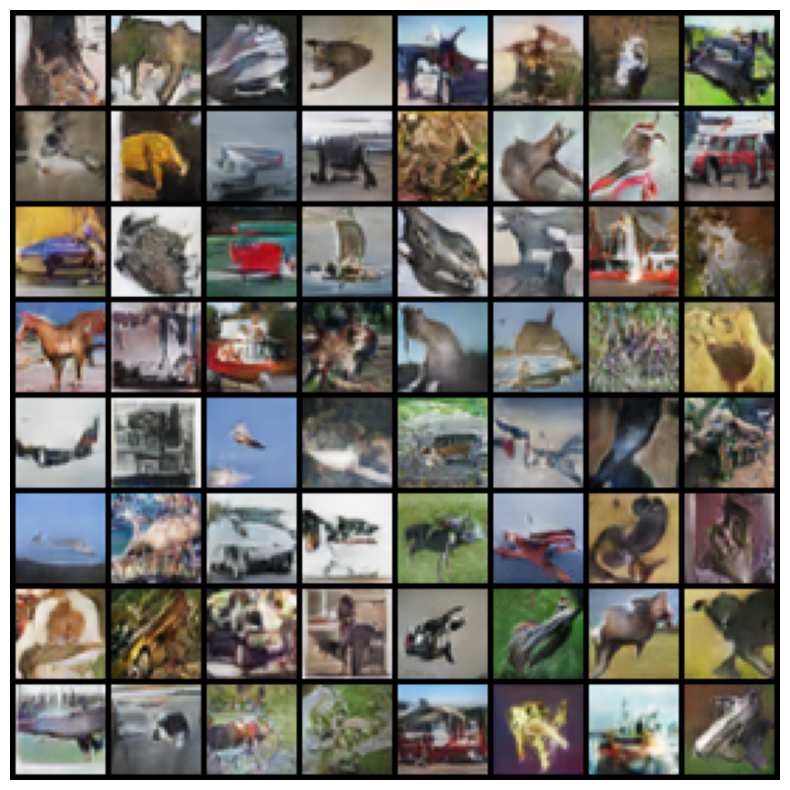

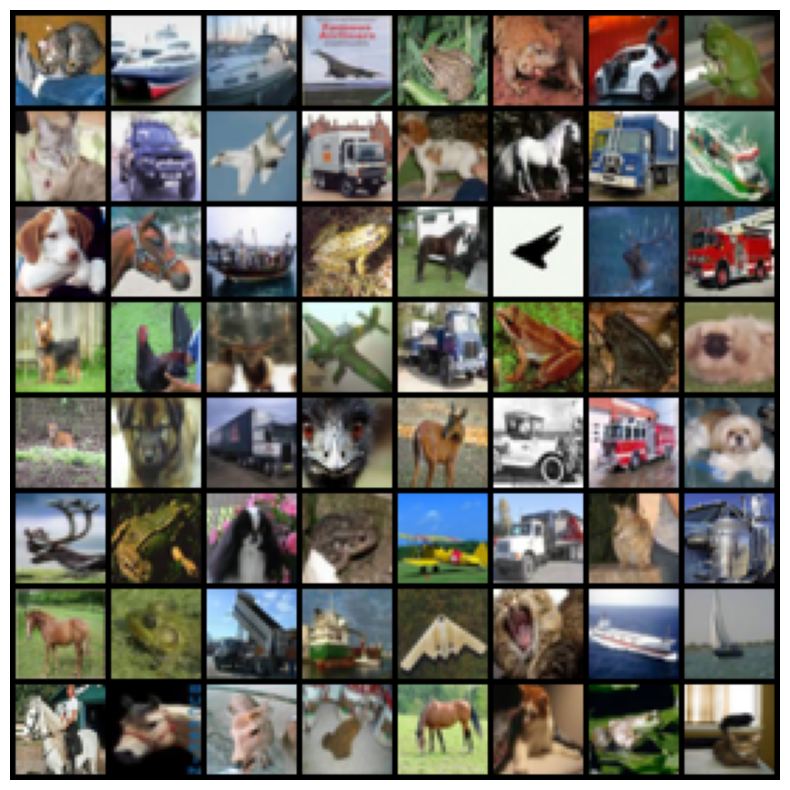

In [112]:
model_G_v2 = torch.jit.load(content_path/'GAN/GAN_G_model_v2.pth')


input_noise = torch.randn(64, latent_vector_size_v2, 1, 1, device=device)  #generate 64 images
with torch.no_grad():
    generated = model_G_v2(input_noise).cpu()
    generated = make_grid(denorm_v2(generated), nrow=8, padding=2, normalize=False,
                        value_range=None, scale_each=False, pad_value=0)  # nrow=8 for 64 images
    plt.figure(figsize=(10,10))
    plt.axis('off')  
    show(generated)

it = iter(loader_test)
sample_inputs, _ = next(it)  
fixed_input = sample_inputs[:64, :, :, :]  # Select first 64 images for a fair comparison
img = make_grid(denorm_v2(fixed_input), nrow=8, padding=2, normalize=False,
                        value_range=None, scale_each=False, pad_value=0)  # nrow=8 for 64 images
plt.figure(figsize=(10,10))
plt.axis('off')  
show(img)

### Architecture 3 [BEST]: Generator Sample

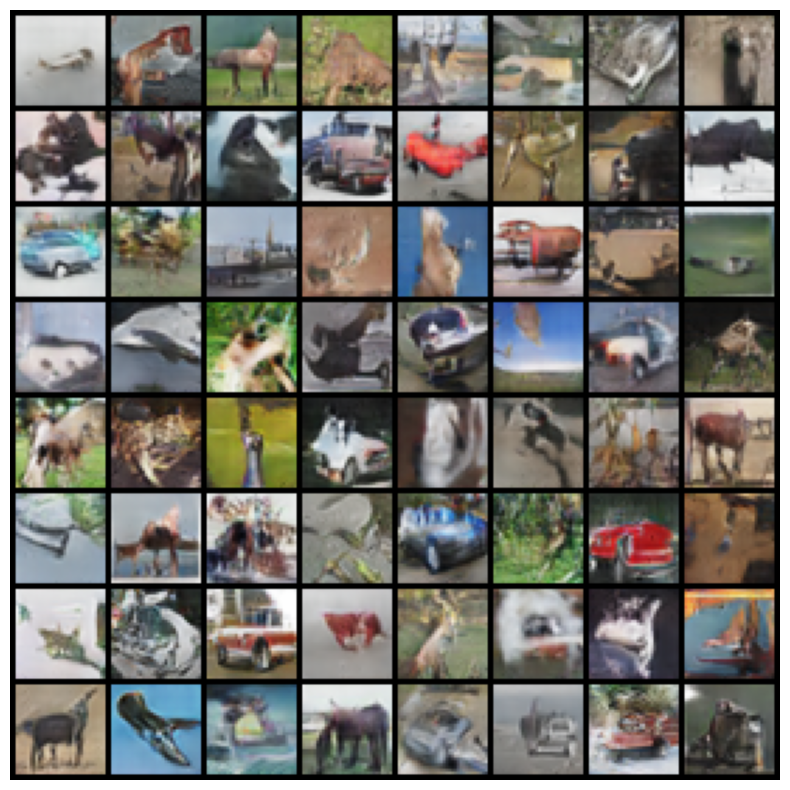

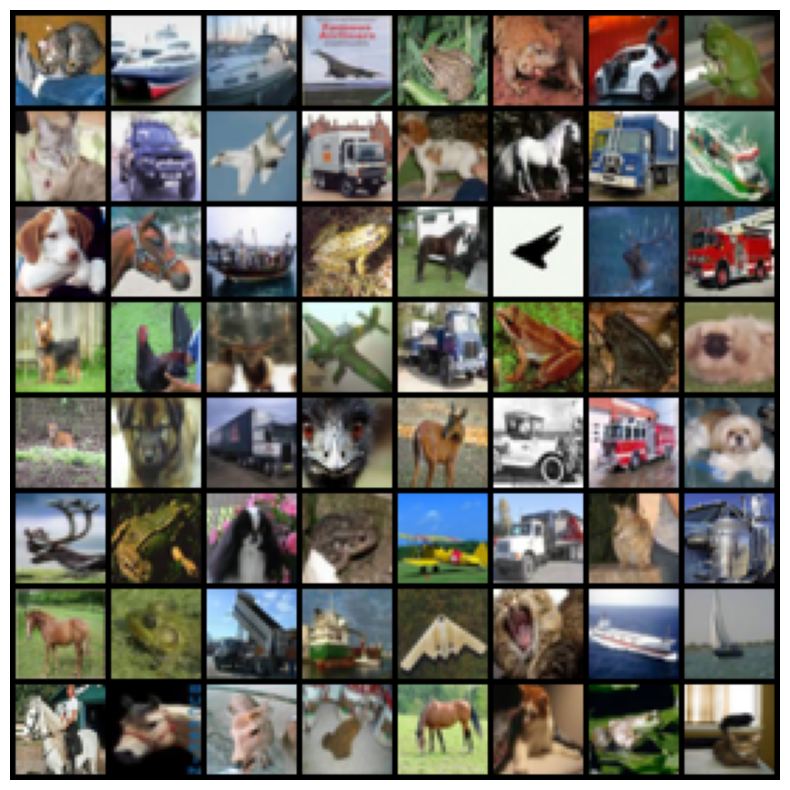

In [125]:
model_G_v3 = torch.jit.load(content_path/'GAN/GAN_G_model_v3.pth')

input_noise = torch.randn(64, latent_vector_size_v3, 1, 1, device=device)  #generate 64 images
with torch.no_grad():
    generated = model_G_v3(input_noise).cpu()
    generated = make_grid(denorm_v3(generated), nrow=8, padding=2, normalize=False,
                        value_range=None, scale_each=False, pad_value=0)  # nrow=8 for 64 images
    plt.figure(figsize=(10,10))
    plt.axis('off') 
    show(generated)


it = iter(loader_test)
sample_inputs, _ = next(it) 
fixed_input = sample_inputs[:64, :, :, :]  # Select first 64 images for a fair comparison
img = make_grid(denorm_v3(fixed_input), nrow=8, padding=2, normalize=False,
                        value_range=None, scale_each=False, pad_value=0)  # nrow=8 for 64 images
plt.figure(figsize=(10,10))
plt.axis('off') 
show(img)

### Architecture 4: Generator Sample

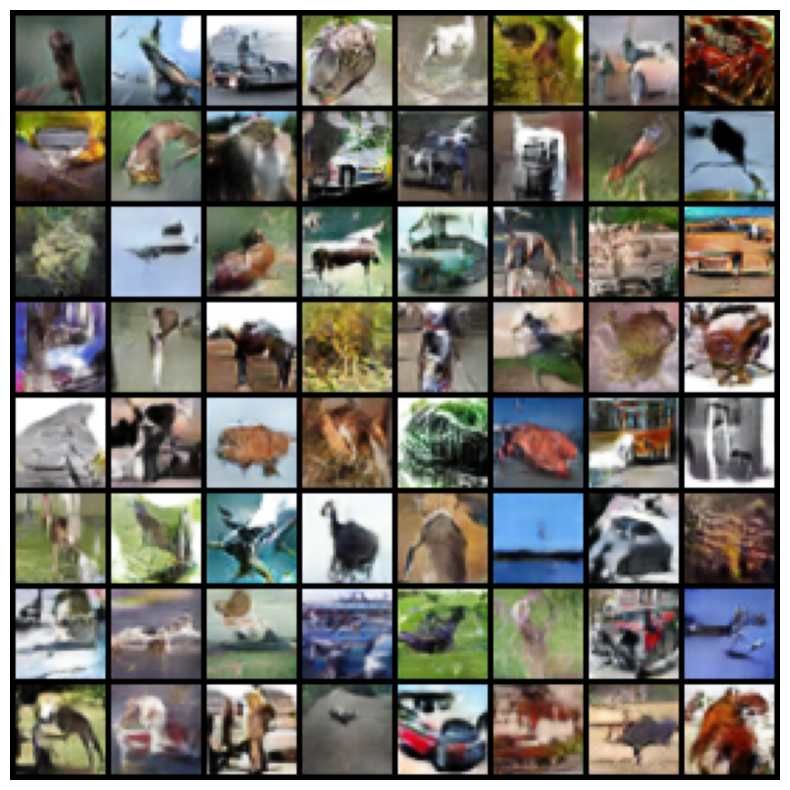

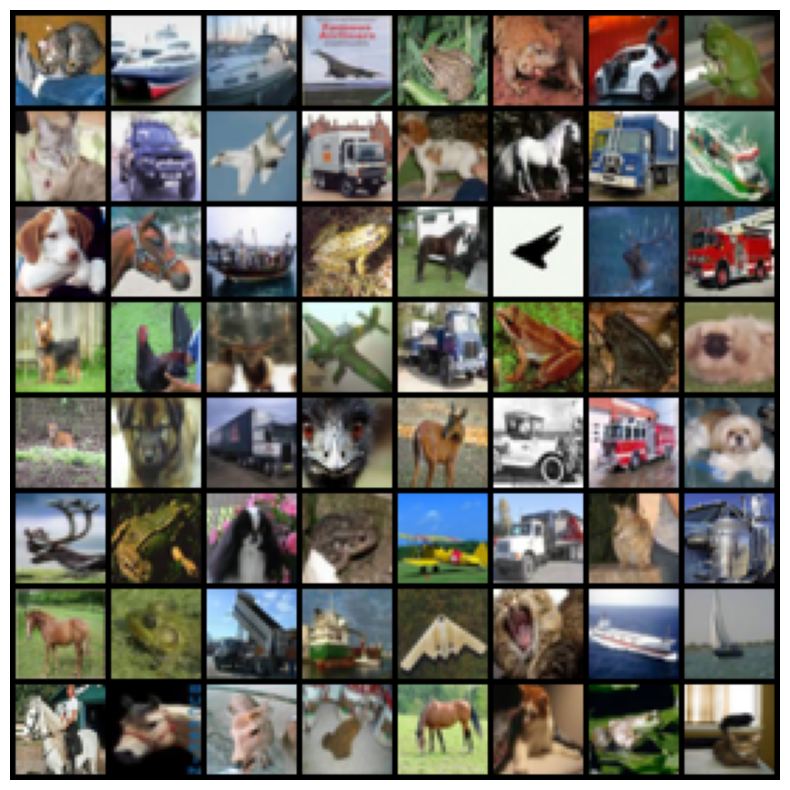

In [117]:
model_G_v4 = torch.jit.load(content_path/'GAN/GAN_G_model_v4.pth')

input_noise = torch.randn(64, latent_vector_size_v4, 1, 1, device=device)  #generate 64 images
with torch.no_grad():
    generated = model_G_v4(input_noise).cpu()
    generated = make_grid(denorm_v4(generated), nrow=8, padding=2, normalize=False,
                        value_range=None, scale_each=False, pad_value=0)  # nrow=8 for 64 images
    plt.figure(figsize=(10,10))
    plt.axis('off')  
    show(generated)

it = iter(loader_test)
sample_inputs, _ = next(it)  
fixed_input = sample_inputs[:64, :, :, :]  # Select first 64 images for a fair comparison
img = make_grid(denorm_v4(fixed_input), nrow=8, padding=2, normalize=False,
                        value_range=None, scale_each=False, pad_value=0)  # nrow=8 for 64 images
plt.figure(figsize=(10,10))
plt.axis('off') 
show(img)

## Part 2.1d: Engineering Choices

In refining the DCGAN architecture, I experimented with four distinct architectures, each informed by a mix of literature review, empirical testing, and iterative design adjustments. Below are the detailed explorations and design choices for each architecture:

### Architecture 1: Basic DCGAN with Learnable Scale
- **Batch Size**: 128, a standard choice for balancing computational efficiency and stable gradient estimates.
- **Learning Rate**: A fixed rate of 0.0002 for both generator and discriminator.
- **Latent Vector Size**: 100, providing a dense but manageable dimensional space for generating images.
- **Normalization**: Standard batch normalization was applied to stabilize training and improve convergence.
- **Special Features**: Introduced a learnable scale parameter to address over-saturation in generated images.
- **Outcome**: Achieved decent image quality after 1000 epochs, but the need for a learnable scale indicated potential improvements in normalization or initialization strategies.

### Architecture 2: Modified Normalization and Learning Rates
- **Adjustments in Normalization**: Changed mean and standard deviation for input normalization, removing the need for a learnable scale parameter.
- **Diverging Learning Rates**: Applied different learning rates for the generator (0.0004) and discriminator (0.0002), enhancing the balance between the two networks.
- **Outcome**: Observed better image quality within 200 epochs, a significant improvement over the first approach.

### Architecture 3 [BEST]: Label Smoothing and Dropout Integration
- **Label Smoothing**: Applied to both real and fake labels to prevent the discriminator from becoming overly confident, promoting a more competitive training process.
- **Dropout in Discriminator**: Added to introduce noise and further regularize the discriminator, preventing it from overpowering the generator.
- **Outcome**: This architecture produced significantly better images, with recognizable features and improved realism, making it the best performing among the four.

### Architecture 4: Addition of Minibatch Discrimination and Spectral Normalization
- **Minibatch Discrimination**: Incorporated in the discriminator to encourage diversity in the generated images by penalizing lack of diversity within a batch.
- **Spectral Normalization**: Applied to the discriminator's layers to control the Lipschitz constant, theoretically improving training stability.
- **Optimizer Change**: Transitioned to using the AdamW optimizer for both the generator and discriminator. This modification is intended to improve training stability and convergence by directly incorporating weight regularization into the optimization process, rather than as an afterthought.
- **Outcome**: Despite the increased complexity, optimizer change and parameter count, this architecture did not outperform the third approach in terms of image quality.


### Other Engineering Decisions:

- **Batch Size Consistency**: Maintained a constant batch size of 128 across all experiments to isolate the effects of architectural changes.
- **Normalization Parameters**: Adjusting normalization parameters played a pivotal role in addressing image saturation and enhancing overall image quality.
- **Adaptive Learning Rates**: The decision to use different learning rates for the generator and discriminator was pivotal in achieving faster convergence and better image quality.

### Empirical Methods and Design Choices

1. **Batch Size Consistency**: I opted for a batch size of 128 across all experiments, finding this to be a sweet spot that balanced computational efficiency with the robustness of gradient approximations.

2. **Adaptive Learning Rates**: Diverging learning rates for the generator and discriminator were pivotal. This adjustment directly addressed the tug-of-war between the two networks, fostering a more balanced training process.

3. **Normalization Techniques**: Batch normalization was a staple in my generator architectures, proving essential for stabilizing training. However, incorporating spectral normalization in the discriminator, despite its theoretical promise, didn't markedly enhance output quality in my setup.

4. **Label Smoothing and Dropout**: These techniques were game-changers, significantly refining the generated image quality. Label smoothing, in particular, curbed the discriminator's overconfidence, ensuring a more equitable adversarial contest.

### Insights on What Worked and Impactful Discoveries

1. **Normalization Adjustments**: Tweaking the mean and standard deviation for normalization eliminated the need for a learnable scale parameter, streamlining the model while improving image fidelity.

2. **Strategic Dropout**: Integrating dropout within the discriminator introduced a desirable regularization effect, combating overfitting effectively.

3. **Label Smoothing Efficacy**: This approach not only tempered the discriminator's overconfidence but also contributed to a noticeable uplift in image realism.

### Reflections on Unsuccessful Attempts

1. **Spectral Normalization's Limited Impact**: Contrary to expectations, spectral normalization didn't significantly propel the quality of generated images forward. This outcome underscored the nuanced nature of GAN training dynamics and the potential model-specificity of certain techniques.

2. **Extended Training Epochs' Diminishing Returns**: Pushing for more training epochs initially seemed logical for quality enhancement. However, it became clear that beyond a certain threshold, the quality gains plateaued, highlighting the importance of efficient training regimes.
3. **Feature matching and minibatch discrimination** Feature matching and minibatch discrimination did not yield the expected improvements in my DCGAN model, possibly due to the increased complexity not aligning well with the specific characteristics of the dataset and model architecture.

### Literature-Inspired Techniques and Their Relevance

While not all explored in depth, techniques such as experience replay and progressive growing of GANs from the literature hinted at promising pathways for future exploration. Specifically, the concept of experience replay intrigued me as a potential avenue for further stabilizing training and enhancing the generated image's fidelity. Experience replay, which involves reusing past generated images to train the discriminator, can prevent catastrophic forgetting and contribute to a more stable GAN training process.


## Part 2.2: Understanding GAN Training


### Loss Curves

### Architecture 1: Loss Curve

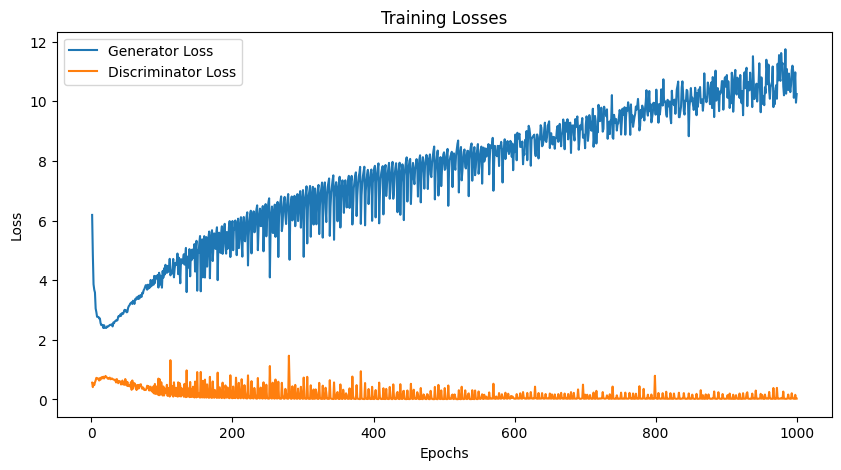

In [27]:
# ANSWER FOR PART 2.2 IN THIS CELL*

import matplotlib.pyplot as plt

epochs = range(1, len(train_losses_G) + 1)

plt.figure(figsize=(10, 5))
plt.plot(epochs, train_losses_G, label='Generator Loss')
plt.plot(epochs, train_losses_D, label='Discriminator Loss')
plt.title('Training Losses')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


### Architecture 2: Loss Curve

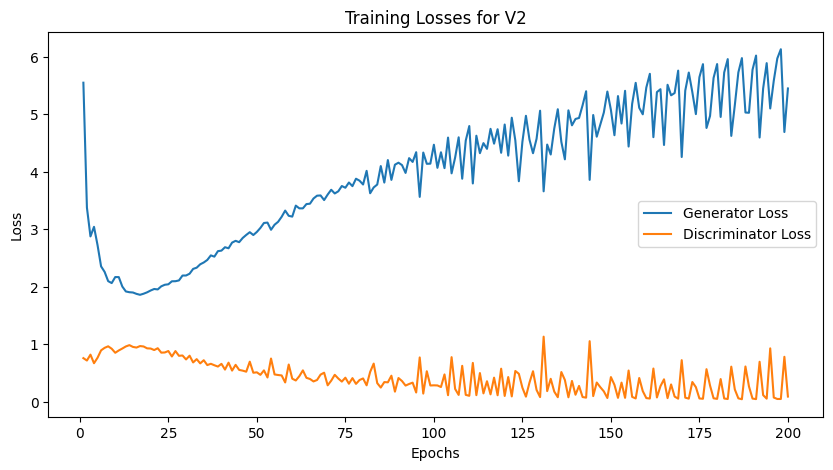

In [111]:
import matplotlib.pyplot as plt

epochs = range(1, len(train_losses_G_v2) + 1)

plt.figure(figsize=(10, 5))
plt.plot(epochs, train_losses_G_v2, label='Generator Loss')
plt.plot(epochs, train_losses_D_v2, label='Discriminator Loss')
plt.title('Training Losses for V2')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

### Architecture 3: Loss Curve

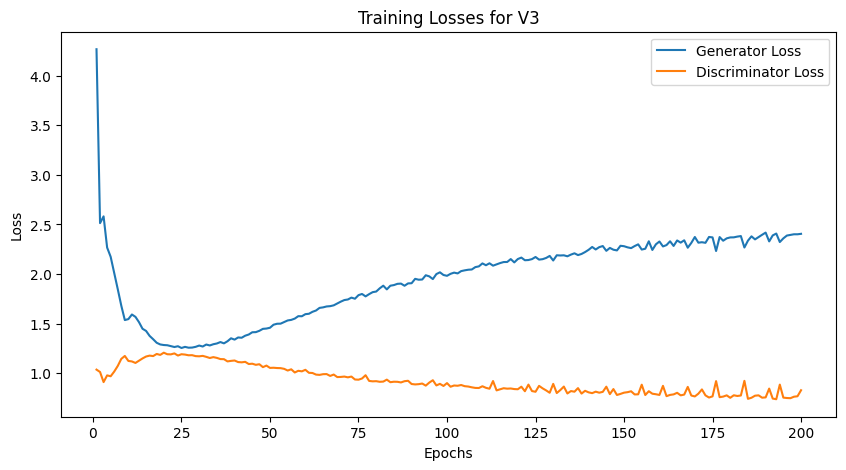

In [13]:
import matplotlib.pyplot as plt

epochs = range(1, len(train_losses_G_v3) + 1)

plt.figure(figsize=(10, 5))
plt.plot(epochs, train_losses_G_v3, label='Generator Loss')
plt.plot(epochs, train_losses_D_v3, label='Discriminator Loss')
plt.title('Training Losses for V3')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

### Architecture 4: Loss Curve

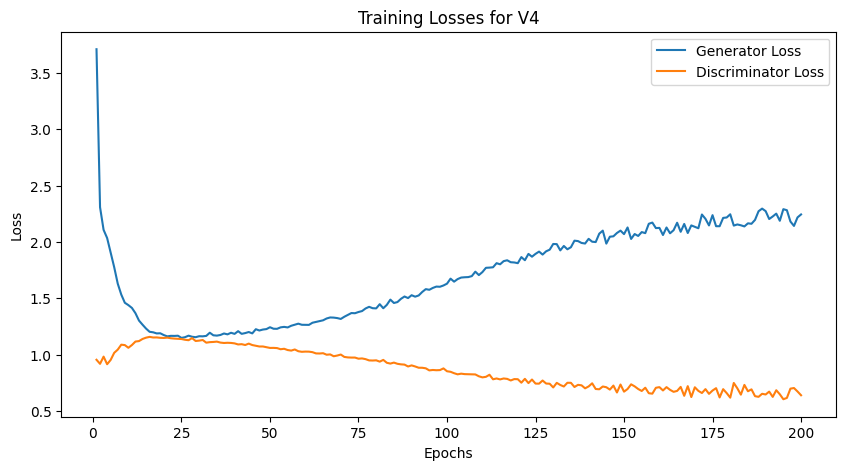

In [113]:
import matplotlib.pyplot as plt

epochs = range(1, len(train_losses_G_v4) + 1)

plt.figure(figsize=(10, 5))
plt.plot(epochs, train_losses_G_v4, label='Generator Loss')
plt.plot(epochs, train_losses_D_v4, label='Discriminator Loss')
plt.title('Training Losses for V4')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

### Discussion

Upon aligning the loss curves with the performance of each architecture and the methods discussed earlier, my observations are as follows:

1. **Architecture V1**: Despite the generator's loss increasing over time, which generally would be a cause for concern, the actual images generated showed reasonable quality after 1000 epochs. The increase in loss could be indicative of the generator finding it difficult to fool the discriminator, but since the images did improve, it may also suggest that the generator was learning more complex features that the discriminator initially found easier to classify as fake. The learnable scale parameter adjustment for over-saturation seems to have been crucial here.

2. **Architecture V2**: The stabilization of the generator's loss and the low discriminator loss suggest that the architecture found a better balance between the generator and discriminator earlier in training, within 200 epochs. In contrast, V1's generator loss steadily increases, suggesting potential overfitting or a less effective generator. The change in mean and standard deviation for the input normalization, as well as the different learning rates for the generator and discriminator, likely contributed to this more stable training dynamic. 

3. **Architecture V3**: The best-performing architecture as per the earlier discussion showed a stable discriminator loss and a generator loss that increased but at a much slower rate compared to V1 and V2. The inclusion of label smoothing and dropout in the discriminator appears to have allowed for more stable training, leading to higher-quality images where certain features like animal legs or car wheels became recognizable. The loss curve corroborates these findings, suggesting that despite the upward trend in generator loss, the model was learning effectively.

4. **Architecture V4**: The loss curve shows a similar trend to V3, with the generator loss increasing over time. However, despite the additional complexity from minibatch discrimination and spectral normalization, there was no significant improvement in the quality of the generated images when compared to V3. This suggests that these additional features did not contribute to better learning within the GAN framework for this particular application. The generator loss's upward trend might indicate that these extra complexities did not translate to better learning or more realistic image generation.

**Expected Behavior**
In general, sensible loss curves for GANs would have the generator and discriminator losses converging to a point where neither can improve significantly because the generator produces near-realistic images, and the discriminator is correctly identifying real and fake images. Fluctuations are common, but large divergences or steep trends, especially in the generator loss, can indicate issues in training. The expectation is a balance where both networks improve over time, leading to a stable equilibrium. The curves for architectures V3 and V4 align more with these expectations, suggesting more effective training dynamics.

## Part 2.3: Understanding Mode Collapse

### Discussion


Mode collapse occurs in Generative Adversarial Networks (GANs) when the generator learns to produce a limited range of outputs, or "modes," rather than a diverse set that represents the target data distribution. This typically happens when the generator finds a particular pattern or set of patterns that consistently fool the discriminator, and thus it has no incentive to explore and learn other variations within the data.

**How Mode Collapse Manifests in Samples:**
- Lack of Diversity: Generated samples might look very similar to each other, even when different latent vectors are used as input.
- Missing Classes: In a dataset with multiple classes, mode collapse might result in the absence of certain classes from the generated samples.
- Stagnation: Over time, the variety of generated images does not increase, and the same types of images continue to be produced.

In my case, since no mode collapse was observed across the different architectures, it suggests that the methods I used for GAN were able to maintain a healthy diversity in the generated samples. This could be attributed to several factors:

1. **Effective Architecture Choices**: The right balance between the generator and discriminator complexity can prevent the generator from overfitting to specific modes that fool the discriminator.

2. **Regularization Techniques**: The use of dropout, label smoothing, and possibly minibatch discrimination may have contributed to preventing mode collapse by encouraging the generator to explore more of the data distribution.

3. **Optimization Techniques**: The use of different learning rates for the generator and discriminator, as well as using Adam or AdamW optimizers, can help maintain the balance between the two networks, preventing the generator from exploiting weaknesses in the discriminator.

4. **Training Dynamics**: The loss curves suggest that the generator and discriminator were in a competitive equilibrium where both had to continuously improve, which prevents the generator from settling on a limited set of outputs.

To reduce or eliminate mode collapse one can experimented with:
- **Altering Network Capacity**: Ensuring neither the generator nor the discriminator is too powerful relative to the other.
- **Experience Replay**: Introducing past generated images back into the training process to remind the discriminator of previous generator outputs. But this did not help
- **Penalty-Based Methods**: Applying penalties to the loss function to discourage lack of diversity in the generated samples.


# Test
<font color="orange"> <b> Provide the input and output transformations required to make your GANs work </b></font>


In [ ]:
# If you want to run these tests yourself, change directory:
%cd 'dl/'
ta_data_path = "../data" # You can change this to = data_path when testing

In [4]:
!pip install -q torch torchvision

In [5]:
# Do not remove anything here
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
import torch.nn.functional as F
import matplotlib.pyplot as plt 

show = lambda img: plt.imshow(np.transpose(img.cpu().numpy(), (1,2,0)))

device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")

# Do not change this cell!
torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

In [6]:
############# CHANGE THESE (COPY AND PASTE FROM YOUR OWN CODE) #############
vae_transform = transforms.Compose([
    transforms.ToTensor(),
])

def vae_denorm(x):
    return x

mean_v3 = torch.Tensor([0.5,0.5,0.5])
std_v3 = torch.Tensor([0.5,0.5,0.5])
unnormalize_v3 = transforms.Normalize((-mean_v3 / std_v3).tolist(), (1.0 / std_v3).tolist())

def denorm_v3(x, channels=None, w=None ,h=None, resize = False):
    
    x = unnormalize_v3(x)
    if resize:
        if channels is None or w is None or h is None:
            print('Number of channels, width and height must be provided for resize.')
        x = x.view(x.size(0), channels, w, h)
    return x
    
def gan_denorm(x):
    return denorm_v3(x)

gan_latent_size = 256

# If your generator requires something other than noise as input, please specify
# two cells down from here

Number of Parameters is 7363840 which is ok


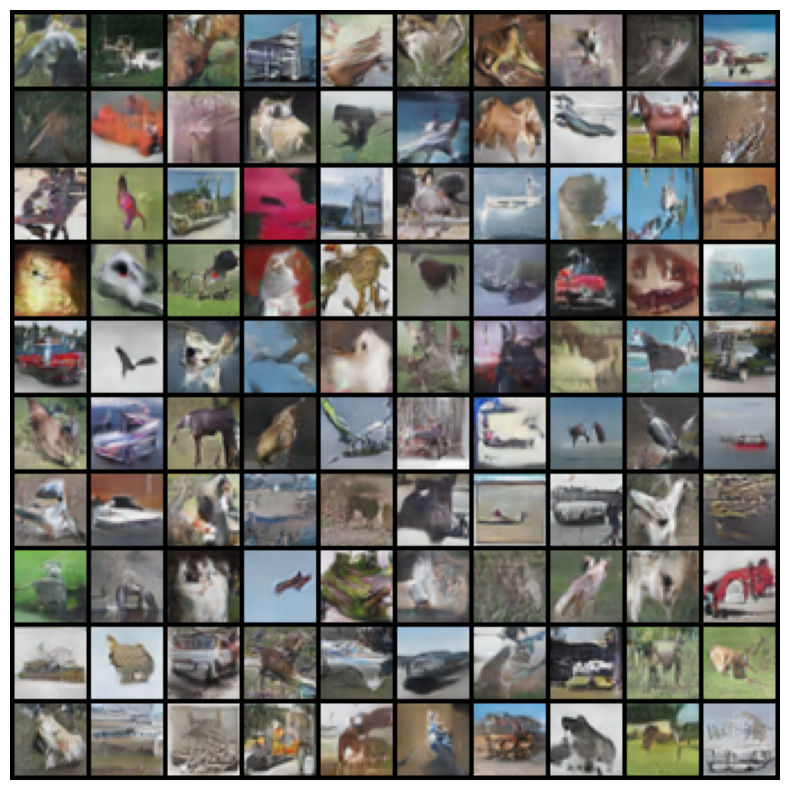

In [10]:
# GAN Tests
model_G = torch.jit.load('./GAN/GAN_G_model.pth')
model_D = torch.jit.load('./GAN/GAN_D_model.pth')
[model.eval() for model in (model_G, model_D)]  

# Check that GAN doesn't have too many parameters
num_param = sum(p.numel() for p in [*model_G.parameters(),*model_D.parameters()])

print(f"Number of Parameters is {num_param} which is", "ok" if num_param<25E+6 else "not ok")

# visualize the generated images
generated = model_G(*gan_input).cpu()
generated = make_grid(gan_denorm(generated)[:100].detach(), nrow=10, padding=2, normalize=False, 
                    value_range=None, scale_each=False, pad_value=0)
plt.figure(figsize=(10,10))
plt.axis('off')
show(generated)